In [2]:
import pickle
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.patches as pat
from sklearn.preprocessing import RobustScaler
from scipy import signal

In [3]:
from scipy.stats import skew,kurtosis
def get_metric(x):
    f,pxx = signal.welch(x,fs=25,nperseg=len(x),nfft=10000)
    pxx = np.abs(pxx)
    pxx = pxx/max(pxx)
    peaks_loc1,_ = signal.find_peaks(pxx[np.where((f>.8)&(f<2.5))[0]],height=.1)
    return np.array([skew(x),kurtosis(x),np.trapz(pxx[np.where((f>.8)&(f<2.5))[0]])/np.trapz(pxx)]).reshape(1,3)

In [4]:
clf = pickle.load(open('./data_saved/quality_classifier.p','rb'))
print(clf)

LogisticRegressionCV(Cs=array([1.00000000e-03, 2.15443469e-03, 4.64158883e-03, 1.00000000e-02,
       2.15443469e-02, 4.64158883e-02, 1.00000000e-01, 2.15443469e-01,
       4.64158883e-01, 1.00000000e+00, 2.15443469e+00, 4.64158883e+00,
       1.00000000e+01, 2.15443469e+01, 4.64158883e+01, 1.00000000e+02,
       2.15443469e+02, 4.64158883e+02, 1.00000000e+03, 2.15443469e+03,
       4.64158883e+03, 1.00...
       4.64158883e+27, 1.00000000e+28, 2.15443469e+28, 4.64158883e+28,
       1.00000000e+29, 2.15443469e+29, 4.64158883e+29, 1.00000000e+30]),
                     class_weight=None, cv=10, dual=False, fit_intercept=True,
                     intercept_scaling=1.0, l1_ratios=None, max_iter=100,
                     multi_class='warn', n_jobs=None, penalty='l2',
                     random_state=None, refit=True, scoring='recall',
                     solver='lbfgs', tol=0.0001, verbose=0)


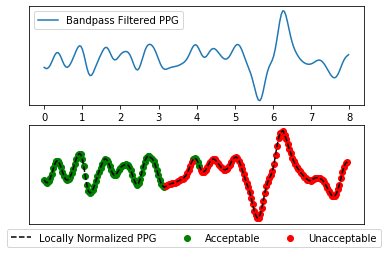

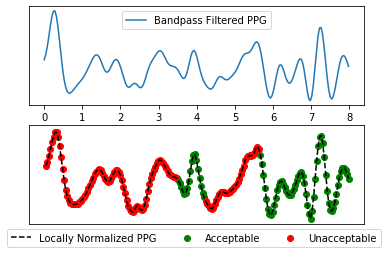

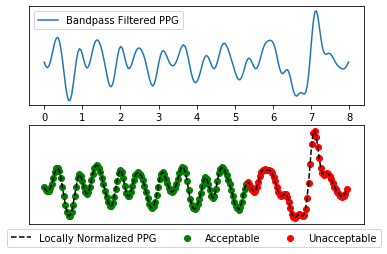

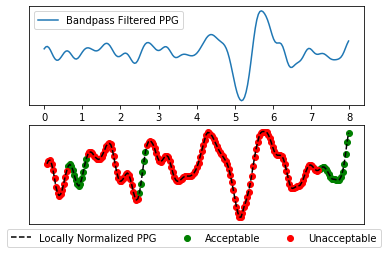

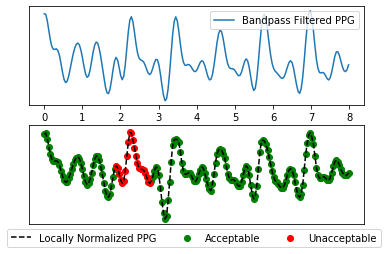

...

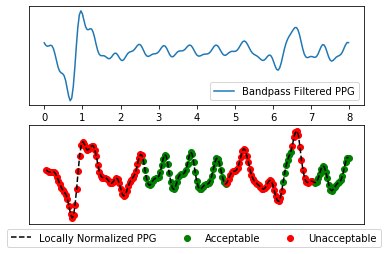

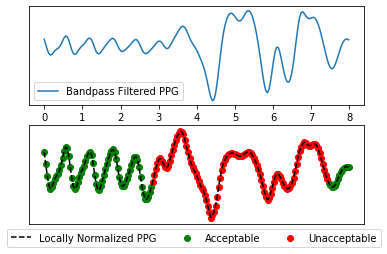

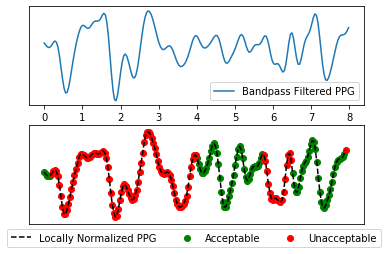

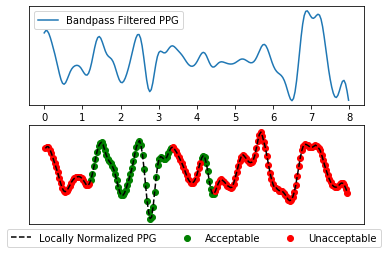

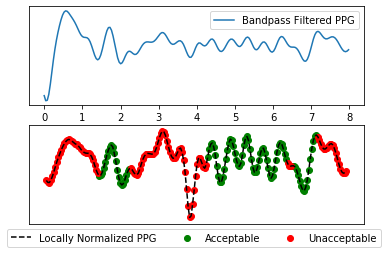

KeyboardInterrupt: 

In [38]:
path = '/home/mullah/Downloads/mperf'
participants = os.listdir(path)
left_right = ['left_final_data_decoded.csv', 'right_final_data_decoded.csv']
window_col = []
label_col = []
import os
import seaborn as sns
import pandas as pd
count = 0
if not os.path.isdir('./images_local_normalized'):
    os.makedirs('./images_local_normalized')
path1 = './images_local_normalized'
for participant in participants:
    file_list = os.listdir(path+'/'+participant)
    for file in file_list:
        final_path = path+'/'+participant+'/'+file+'/'
        files = os.listdir(final_path)
        for r in range(2):
            try:
                ppg_data = pd.read_csv(final_path+left_right[r],compression='gzip',sep=',',header=None).values
                final_data = np.zeros((0,4))
                for i,t in enumerate(ppg_data[:,0]):
                    index = np.where((ppg_data[:,0]>=t-2.5*500)&(ppg_data[:,0]<t+2.5*500))[0]
                    if len(index) < .335*2.5:
                        continue
                    ppg_window = ppg_data[index,:]
                    ppg_window[:,2:5] = RobustScaler().fit_transform(ppg_window[:,2:5])
                    window = np.concatenate([ppg_window[:,0].reshape(-1,1),signal.detrend(ppg_window[:,4]).reshape(-1,1)],
                                            axis=1)
                    sample_value = window[window[:,0]==t,1][0]
                    feature = get_metric(window[:,1])
#                     print(clf.predict(feature))
                    predicted = clf.predict(feature)[0]
                    final_data = np.concatenate((final_data,np.array([t,sample_value,predicted,ppg_data[i,4]]).reshape(-1,4)))
                    if len(final_data)%200==0:
                        import pandas as pd
                        df = pd.DataFrame(data=final_data[-200:],    # values
                                      index=range(final_data[-200:].shape[0]),    # 1st column as index
                                      columns=['time','normalized ppg','Label','Original'])
                        df['Label'][df['Label']==1] = 'Acceptable'
                        df['Label'][df['Label']==-1] = 'Unacceptable'
#                         print(df)
#                         sns.scatterplot(x='time',y = 'normalized ppg',hue='Label',data=df)
                        fig,ax = plt.subplots(nrows=2,ncols=1)
                        ax[1].scatter(df['time'][df['Label']=='Acceptable'],df['normalized ppg'][df['Label']=='Acceptable'],
                                    color='g',label='Acceptable')
                        ax[1].scatter(df['time'][df['Label']=='Unacceptable'],df['normalized ppg'][df['Label']=='Unacceptable'],
                                    color='r',label='Unacceptable')
                        ax[1].plot(df['time'],df['normalized ppg'],linestyle='--',color='k',label='Locally Normalized PPG')
                        ax[1].set_xticks([])
                        ax[1].set_yticks([])
                        ax[1].legend(bbox_to_anchor=(-.08, 0), loc='upper left', ncol=3)
                        ax[0].plot((df['time']-df['time'][0])/1000,df['Original'],label='Bandpass Filtered PPG')
                        ax[0].set_yticks([])
                        ax[0].legend()
                        plt.savefig(path1+'/'+str(count)+'.pdf',dps=1000)
                        count+=1
                        plt.show()
            except Exception as e:
                print(e)


In [ ]:
import shutil
shutil.make_archi